In [2]:
import pandas as pd
import numpy as np
from pandas_profiling import ProfileReport
import seaborn as sns
from matplotlib.collections import LineCollection
from matplotlib.colors import ListedColormap, BoundaryNorm

In [22]:
from fbprophet import Prophet
from fbprophet.plot import plot_plotly

import matplotlib.pyplot as plt
import plotly.offline as py
py.init_notebook_mode()
%matplotlib inline

In [3]:
import os
os.listdir(r"C:\Users\fpg_1\Documents\bike_preds\data")

['day.csv', 'hour.csv']

In [4]:
os.chdir(r'C:\Users\fpg_1\Documents\bike_preds')

In [5]:
hour = pd.read_csv('data/hour.csv')
hour['dteday'] = pd.to_datetime(hour['dteday'])
hour.head()

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1


### Objectives
* Null values? 
    - None
* Does season impact cnt?


In [6]:
ProfileReport(hour, title='Pandas Profiling Report')

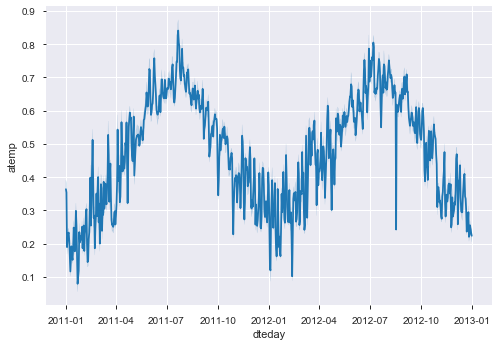

In [7]:
sns.lineplot(x='dteday', y='atemp', data=hour)

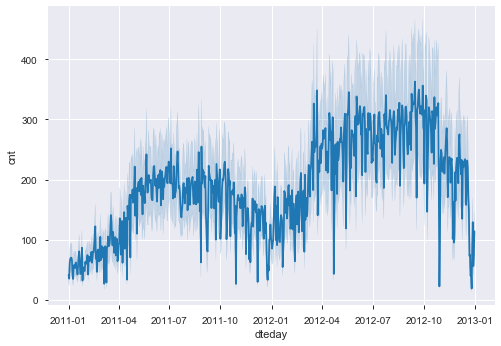

In [8]:
sns.lineplot(x='dteday', y='cnt', data=hour)

In [9]:
from functools import reduce
reduce(np.intersect1d, (hour.groupby('season')['dteday'].unique()))

array([], dtype='datetime64[ns]')

In [10]:
season_enum = { 1:'spring', 2:'summer', 3:'fall', 4:'winter' }
   
hour['season_name'] = hour['season'].apply(lambda id: season_enum[id])

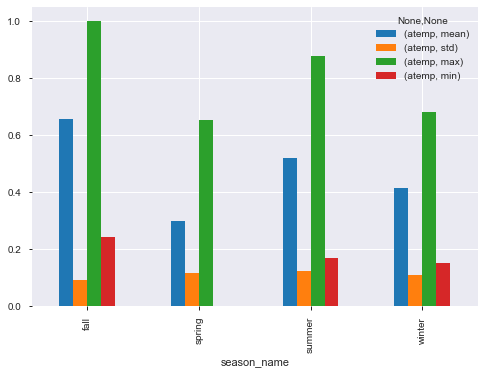

In [11]:
hour.groupby('season_name').aggregate({ 'atemp': ['mean', 'std', 'max', 'min']}).plot.bar()

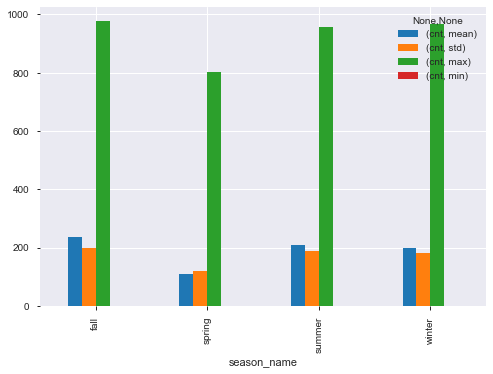

In [12]:
hour.groupby('season_name').aggregate({ 'cnt': ['mean', 'std', 'max', 'min']}).plot.bar()

### weathersit: (extracted from Freemeteo)
* 1: Clear, Few clouds, Partly cloudy, Partly cloudy
* 2: Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist
* 3: Light Snow, Light Rain + Thunderstorm + Scattered clouds, Light Rain + Scattered clouds
* 4: Heavy Rain + Ice Pallets + Thunderstorm + Mist, Snow + Fog

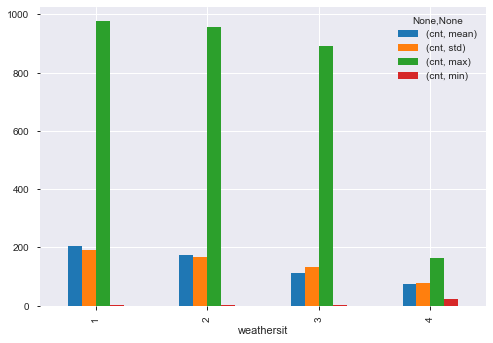

In [13]:
hour.groupby('weathersit').aggregate({ 'cnt': ['mean', 'std', 'max', 'min']}).plot.bar()

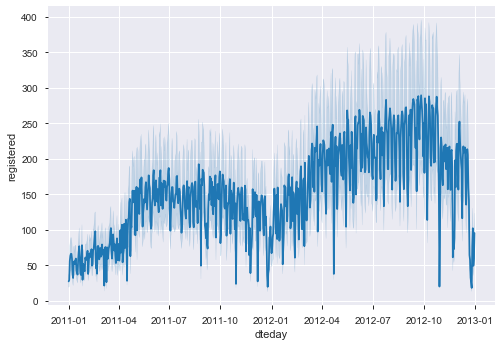

In [14]:
sns.lineplot(x='dteday', y='registered', data=hour)

Adding dteday as a index of the hour dataframe

In [15]:
hour.set_index('dteday', inplace=True)

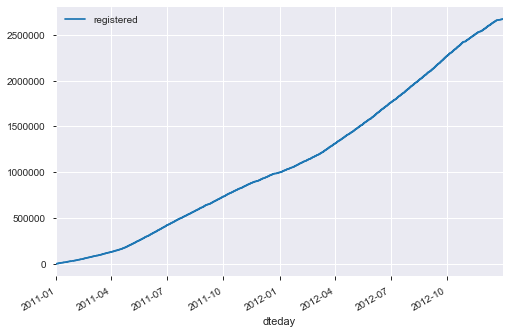

In [16]:
hour[['registered']].cumsum().plot()

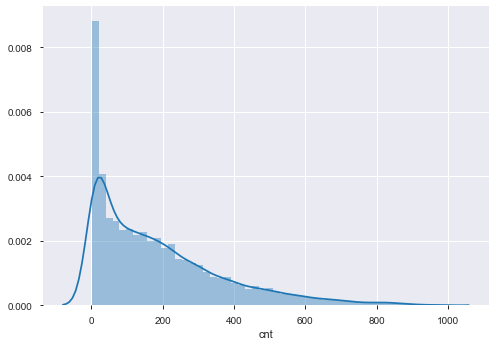

In [17]:
sns.distplot(hour['cnt'])

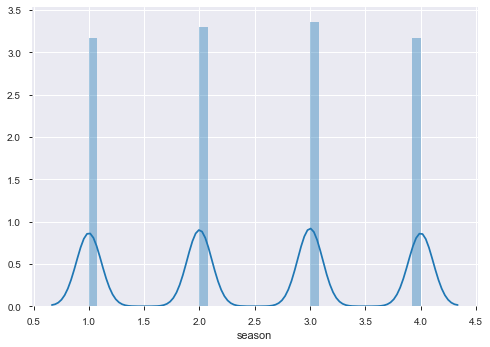

In [18]:
sns.distplot(hour['season'])

<Figure size 576x396 with 0 Axes>

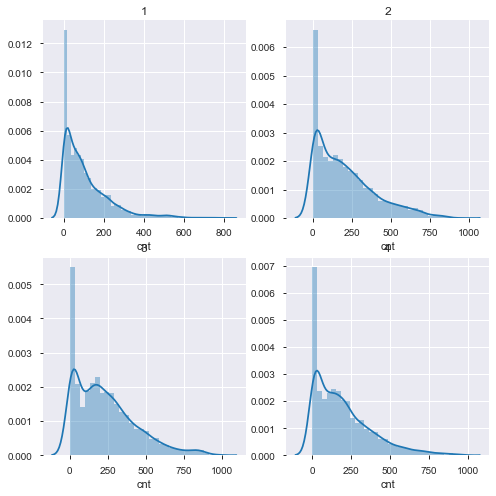

In [19]:
plt.figure();
fig, axs = plt.subplots(2,2, figsize=(8,8));
i = 1
for n_ax in axs:
    for ax in n_ax:
        sns.distplot(hour[hour['season'] == i]['cnt'], ax=ax)
        
        ax.set_title(i);
        i+=1

In [20]:
from scipy.stats.mstats import kruskal

kruskal(
    hour[hour['season'] == 1]['cnt'].values,
    hour[hour['season'] == 2]['cnt'].values,
    hour[hour['season'] == 3]['cnt'].values,
    hour[hour['season'] == 4]['cnt'].values
)

# P value is greater than 0.05; failed to reject null hypo that distributions are same

# print('Statistics=%.3f, p=%.3f' % (stat, p))
# # interpret
# alpha = 0.05
# if pvalue > alpha:
#     print('Same distributions (fail to reject H0)')
# else:
#     print('Different distributions (reject H0)')

KruskalResult(statistic=1190.2686911449543, pvalue=9.47468337305401e-258)

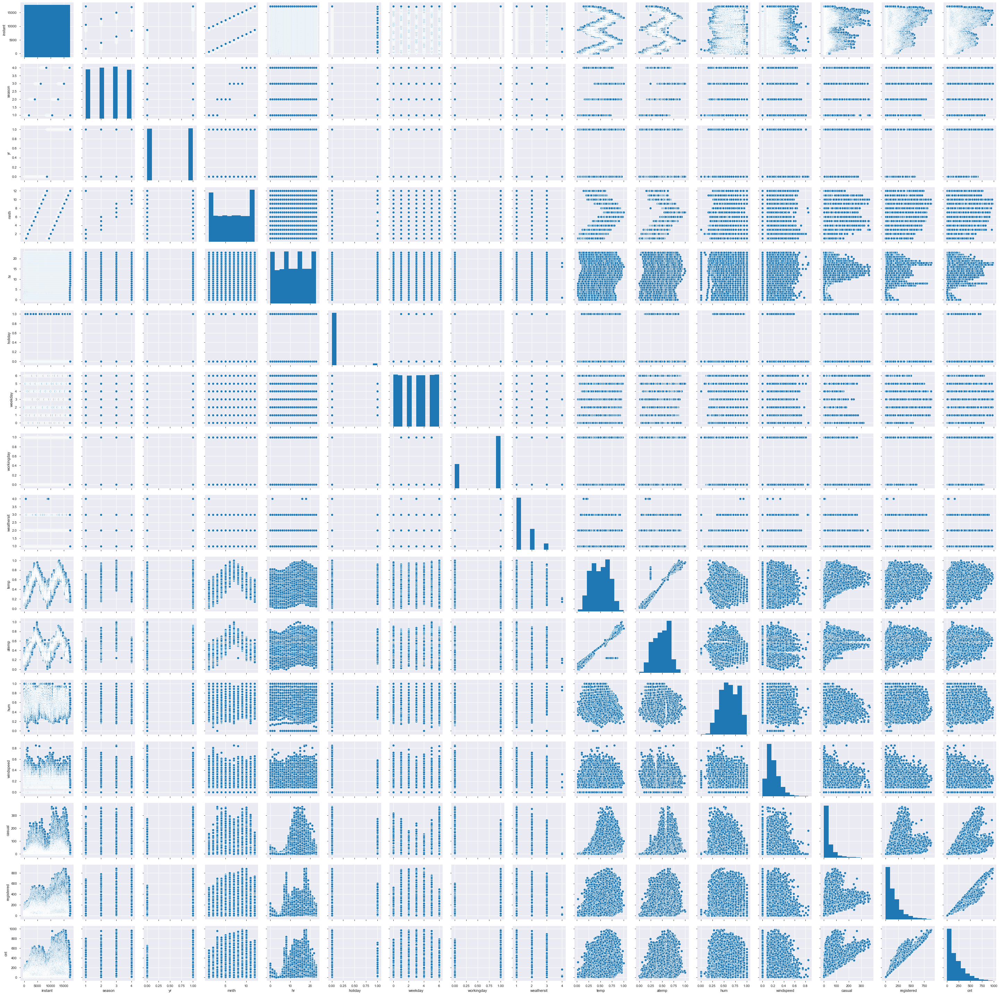

In [23]:
sns.pairplot(hour)